## Imports and Preparing Dataset Class

In [13]:
import sys
sys.path.append("../")

from cv_expt.base.data.base_dataset import ImageDataset, ImageDataType
from cv_expt.base.defs.defs import ImageChannel, DataType
from cv_expt.base.logger.base_logger import BaseLogger, BaseLoggerConfig
from cv_expt.base.configs.configs import TrainerConfig, DataConfig
from cv_expt.vis.visualization import subplot_images
from cv_expt.base.logger.base_logger import BaseLogger
from cv_expt.base.models.base_model import ModelWrapper
from cv_expt.base.trainer.base_trainer import Trainer
from cv_expt.utils.histogram import hist_eq, my_hist
from cv_expt.vis.visualization import subplot_images

from pathlib import Path
from typing import Optional
import torch
import cv2
import numpy as np
from tqdm import tqdm  # for progress bar
from torch import nn
from torch.optim import Optimizer
import segmentation_models_pytorch as smp
import datetime

class HistEqImageDataset(ImageDataset):    
    def _apply_hist_eq(self, img):
        rcbr = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
        rcbr[:, :, 0] = hist_eq(rcbr[:, :, 0])
        return cv2.cvtColor(rcbr, cv2.COLOR_YCrCb2RGB)
        # yuv = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        # yuv[:, :, 0] = cv2.equalizeHist(yuv[:, :, 0])
        # return cv2.cvtColor(yuv, cv2.COLOR_YUV2RGB)
    
      
    def __getitem__(self, idx):        
        if self.config.samples_per_epoch != -1 and idx == len(self)-1:
            self.random_state.shuffle(self.data)
        
        inp = self.get_item(idx)

        if self.config.label_path:
            target = self.get_label(idx)
        else:
            target = inp.copy()

        image = inp
        label = self._apply_hist_eq(target)

        image = cv2.resize(image, self.input_size)
        label = cv2.resize(label, self.input_size)

        if self.transforms:
            image = self.transforms(image)
            label = self.transforms(label)

        if self.normalization:
            image = self.normalization(image)
            label = self.normalization(label)

        # if return_type is tensor, convert the image to tensor
        if self.return_type == ImageDataType.TENSOR:
            image = torch.tensor(image, dtype=torch.float32).permute(2, 0, 1)
            # because the image is grayscale, we need to add the channel dimension
            label = torch.tensor(label, dtype=torch.float32).permute(2, 0, 1)

        return image, label

def normalization(x):
    return x / 255.0

def denormalization(x):
    return x * 255.0

# random seed should be same for both
data_config = DataConfig(
    data_path=Path("../data/coco2017"),
    image_channels=ImageChannel.RGB,
    image_extensions=["jpg", "png"],
    max_data=-1,
    samples_per_epoch=1000,
)
val_data_config = DataConfig(
    data_path=Path("../data/coco2017"),
    image_channels=ImageChannel.RGB,
    image_extensions=["jpg", "png"],
    max_data=-1,
    samples_per_epoch=100,
)
train_dataset = HistEqImageDataset(
    data_config,
    return_type=ImageDataType.TENSOR,
    normalization=normalization,
    denormalization=denormalization,
)
# data_config.samples_per_epoch = 100
val_dataset = HistEqImageDataset(
    val_data_config,
    data_type=DataType.VALIDATION,
    return_type=ImageDataType.TENSOR,
    normalization=normalization,
    denormalization=denormalization,
)


Val Epoch 1:  50%|█████     | 1/2 [02:22<02:22, 142.40s/it, val_loss=0.0344]


Data type: DataType.TRAIN, Number of images: 131165, Data Length: 1000
Data type: DataType.VALIDATION, Number of images: 32792, Data Length: 100


### Sample Images

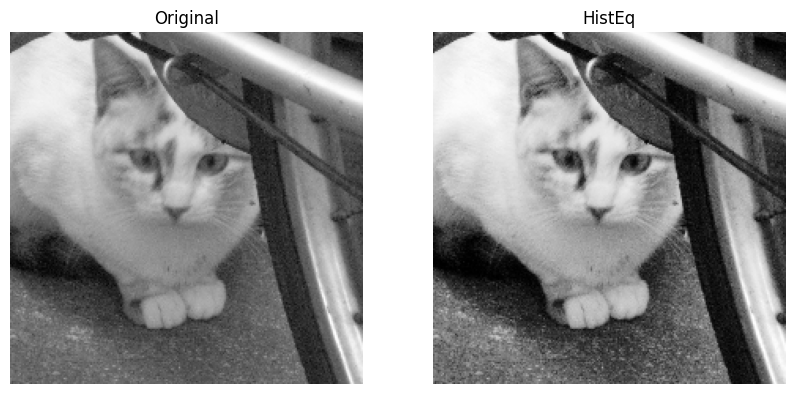

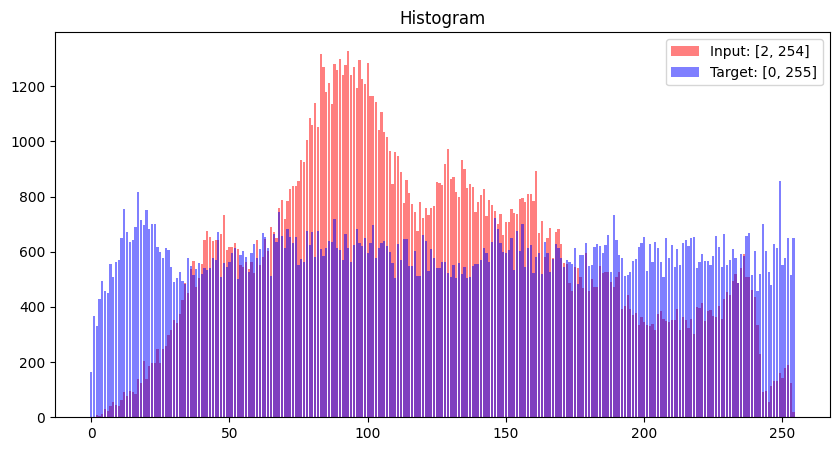

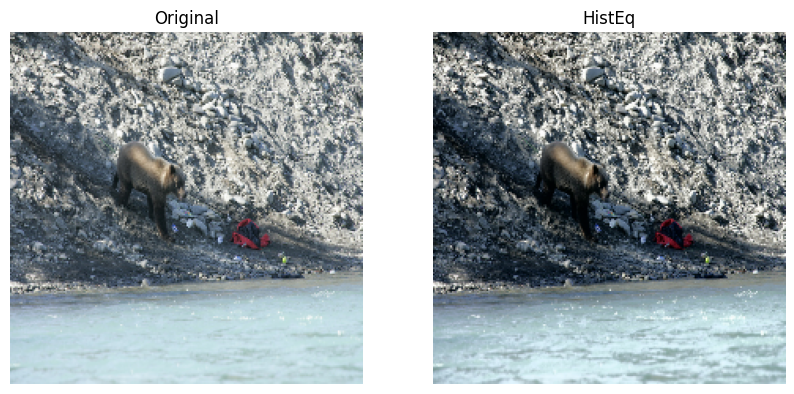

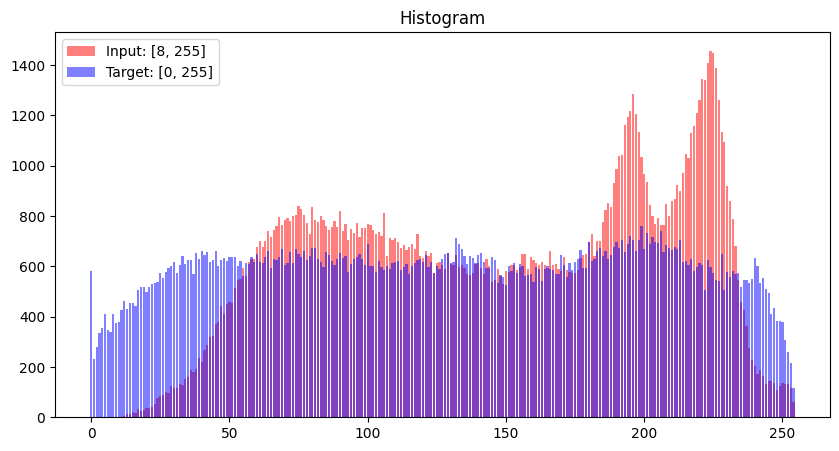

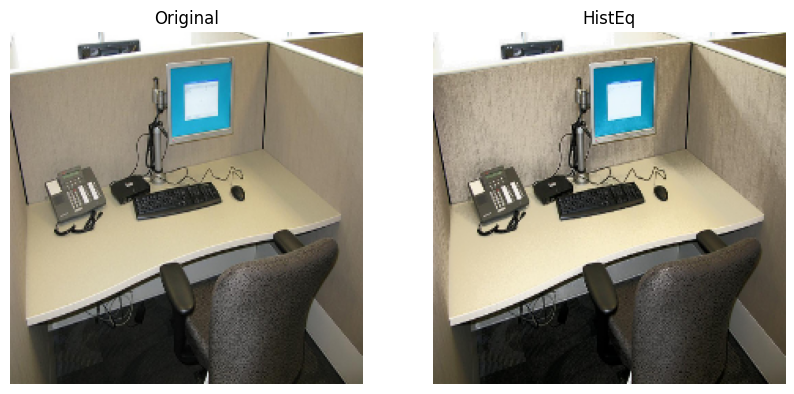

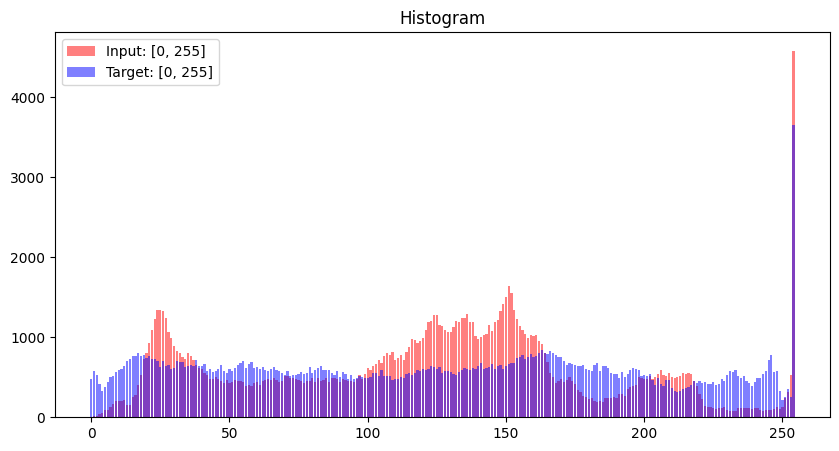

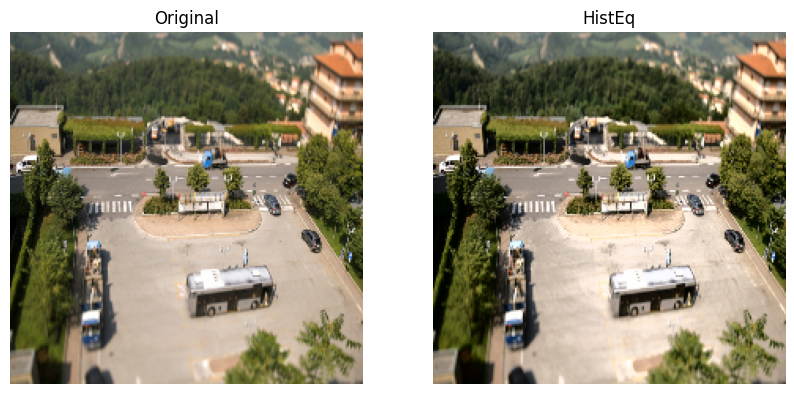

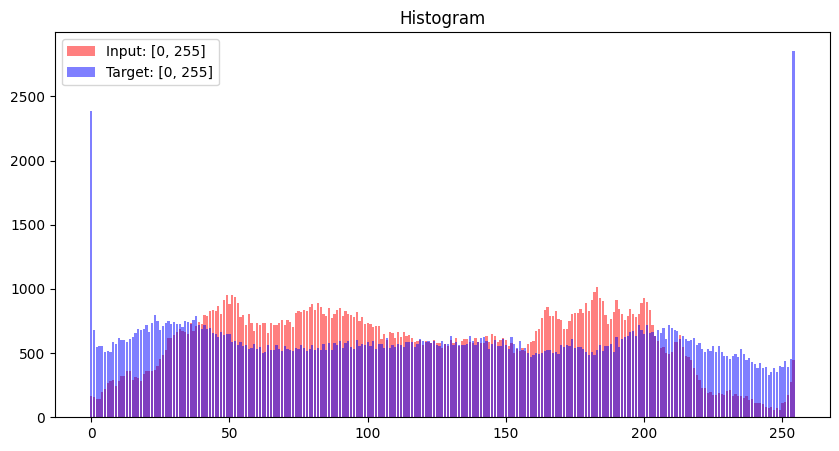

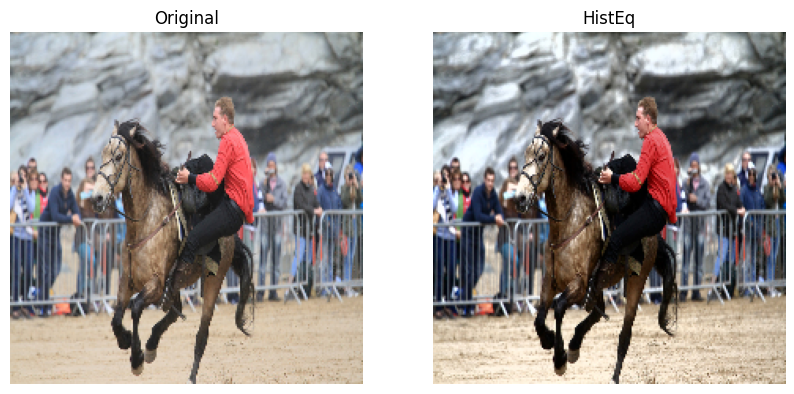

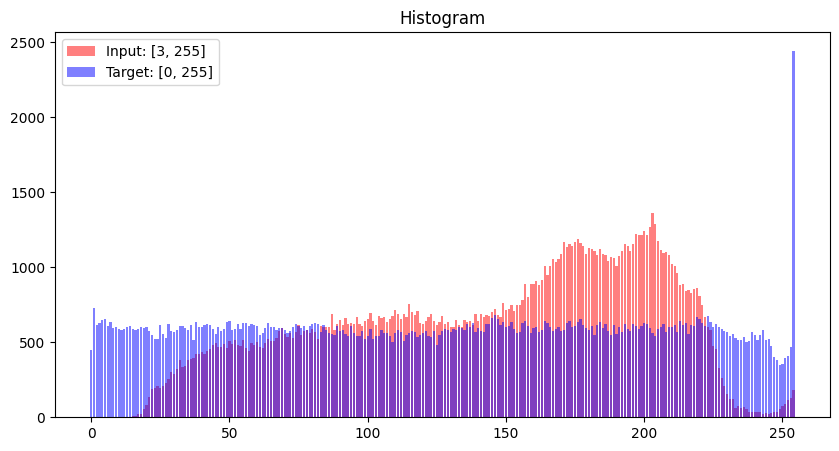

In [14]:
import matplotlib.pyplot as plt

for i in np.random.randint(0, len(train_dataset), 5):
    inp, target = denormalization(train_dataset[i][0].permute(1,2,0).numpy()).astype(np.uint8),denormalization(train_dataset[i][1].permute(1,2,0).numpy()).astype(np.uint8)
    subplot_images([inp,target], ["Original", "HistEq"], order = (-1,2))
    
    hist_inp = my_hist(inp, 255)
    hist_target = my_hist(target, 255)
    # print(sum(hist_orig), sum(hist_pred))
    omax, omin = inp.max(), inp.min()
    pmax, pmin = target.max(), target.min()
    fig = plt.figure(figsize=(10, 5))
    plt.bar(np.arange(len(hist_inp)), hist_inp,  color='r', alpha=0.5, label=f'Input: [{omin}, {omax}]')
    plt.bar(np.arange(len(hist_target)), hist_target, color='b', alpha=0.5, label=f'Target: [{pmin}, {pmax}]')
    plt.legend()
    plt.title("Histogram")
    plt.show()

## Model and Training



































































































































Epoch 0: 100%|██████████| 32/32 [00:24<00:00,  1.32it/s, loss=0.0479]








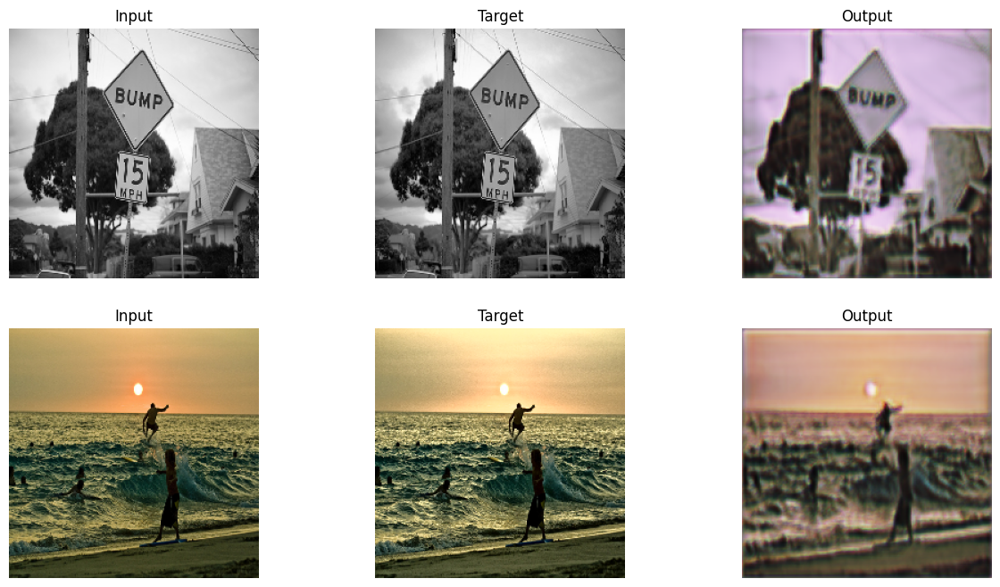













Val Epoch 0: 100%|██████████| 4/4 [00:02<00:00,  1.66it/s, val_loss=0.0271]


































































































































Epoch 1: 100%|██████████| 32/32 [00:23<00:00,  1.34it/s, loss=0.0223]
















Val Epoch 1: 100%|██████████| 4/4 [00:01<00:00,  2.06it/s, val_loss=0.0193]


































































































































Epoch 2: 100%|██████████| 32/32 [00:25<00:00,  1.28it/s, loss=0.0174]
















Val Epoch 2: 100%|██████████| 4/4 [00:01<00:00,  2.02it/s, val_loss=0.016]


































































































































Epoch 3: 100%|██████████| 32/32 [00:25<00:00,  1.27it/s, loss=0.0143]
















Val Epoch 3: 100%|██████████| 4/4 [00:02<00:00,  1.95it/s, val_loss=0.0125]







































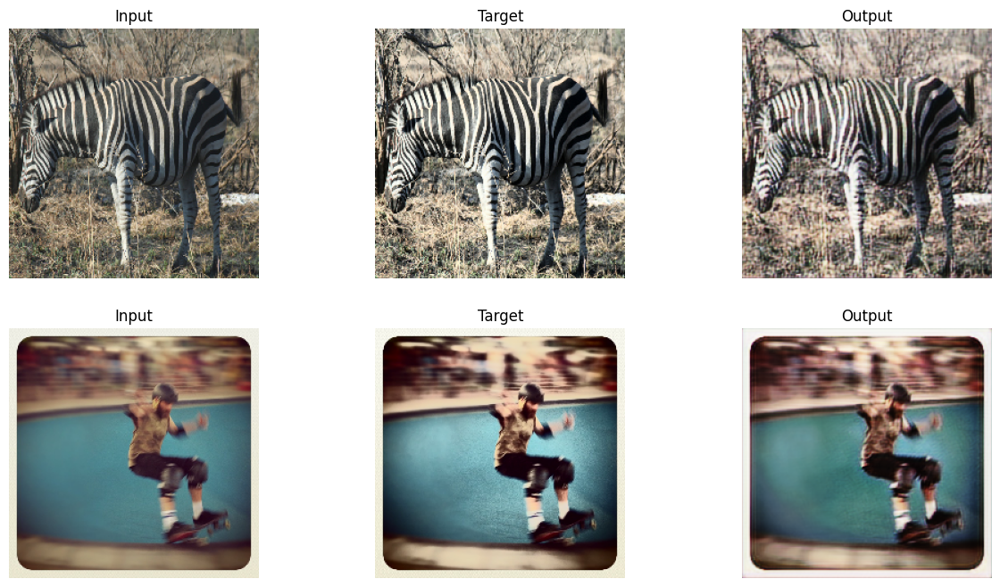











Val Epoch 10: 100%|██████████| 4/4 [00:02<00:00,  1.66it/s, val_loss=0.00959]


































































































































Epoch 11: 100%|██████████| 32/32 [00:24<00:00,  1.32it/s, loss=0.00882]
















Val Epoch 11: 100%|██████████| 4/4 [00:02<00:00,  1.99it/s, val_loss=0.0096]


































































































































Epoch 12: 100%|██████████| 32/32 [00:24<00:00,  1.31it/s, loss=0.00877]
















Val Epoch 12: 100%|██████████| 4/4 [00:01<00:00,  2.09it/s, val_loss=0.0112]


































































































































Epoch 13: 100%|██████████| 32/32 [00:23<00:00,  1.33it/s, loss=0.00817]
















Val Epoch 13: 100%|██████████| 4/4 [00:01<00:00,  2.25it/s, val_loss=0.00962]




























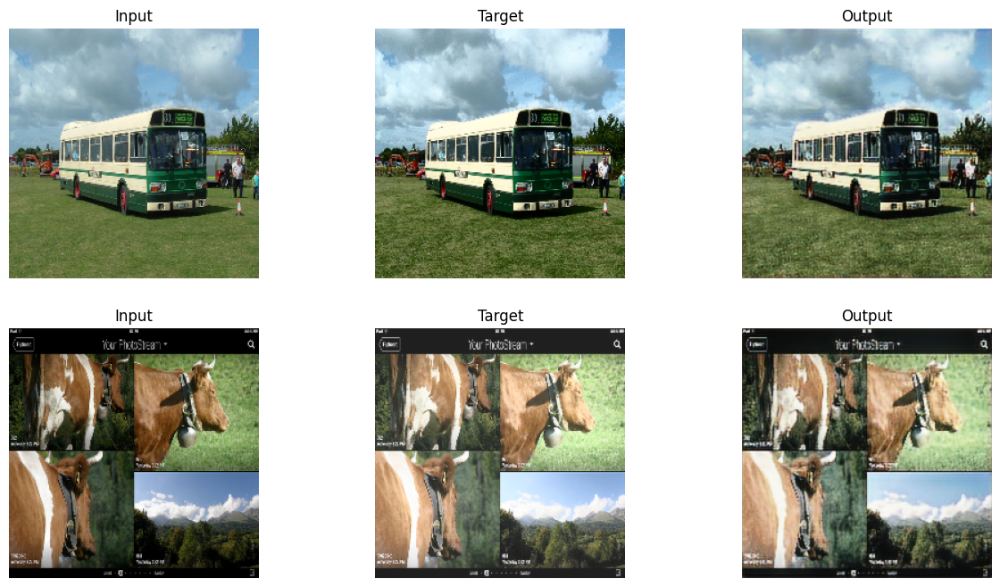













Val Epoch 20: 100%|██████████| 4/4 [00:02<00:00,  1.41it/s, val_loss=0.00664]


































































































































Epoch 21: 100%|██████████| 32/32 [00:28<00:00,  1.11it/s, loss=0.007]
















Val Epoch 21: 100%|██████████| 4/4 [00:02<00:00,  1.84it/s, val_loss=0.00758]


































































































































Epoch 22: 100%|██████████| 32/32 [00:26<00:00,  1.22it/s, loss=0.00708]
















Val Epoch 22: 100%|██████████| 4/4 [00:01<00:00,  2.18it/s, val_loss=0.00829]


































































































































Epoch 23: 100%|██████████| 32/32 [00:28<00:00,  1.14it/s, loss=0.00681]
















Val Epoch 23: 100%|██████████| 4/4 [00:02<00:00,  1.82it/s, val_loss=0.00749]


























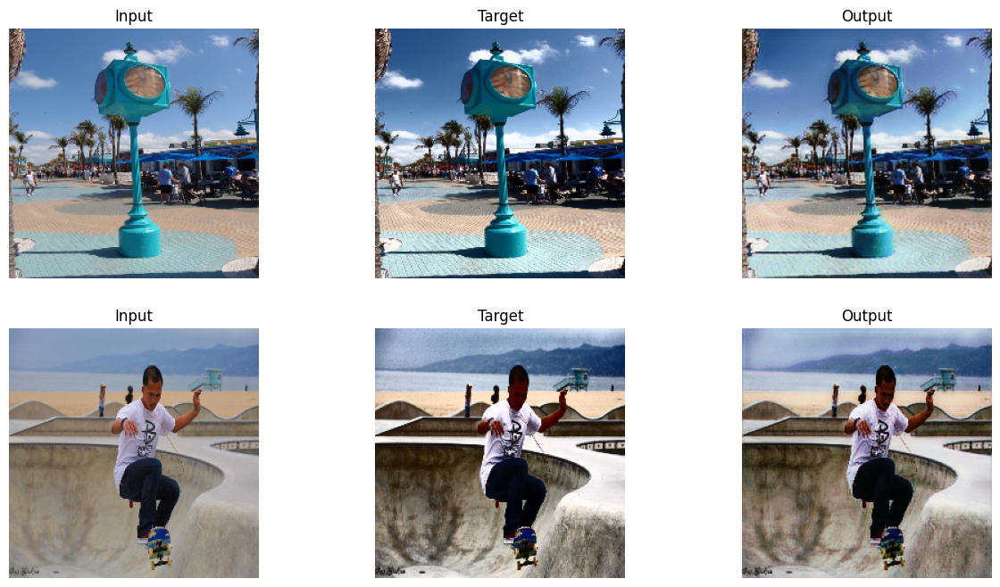











Val Epoch 30: 100%|██████████| 4/4 [00:03<00:00,  1.18it/s, val_loss=0.0065]


































































































































Epoch 31: 100%|██████████| 32/32 [00:27<00:00,  1.17it/s, loss=0.00611]
















Val Epoch 31: 100%|██████████| 4/4 [00:02<00:00,  1.75it/s, val_loss=0.00683]


































































































































Epoch 32: 100%|██████████| 32/32 [00:25<00:00,  1.25it/s, loss=0.00585]
















Val Epoch 40:  25%|██▌       | 1/4 [00:00<00:02,  1.09it/s, val_loss=0.00505]

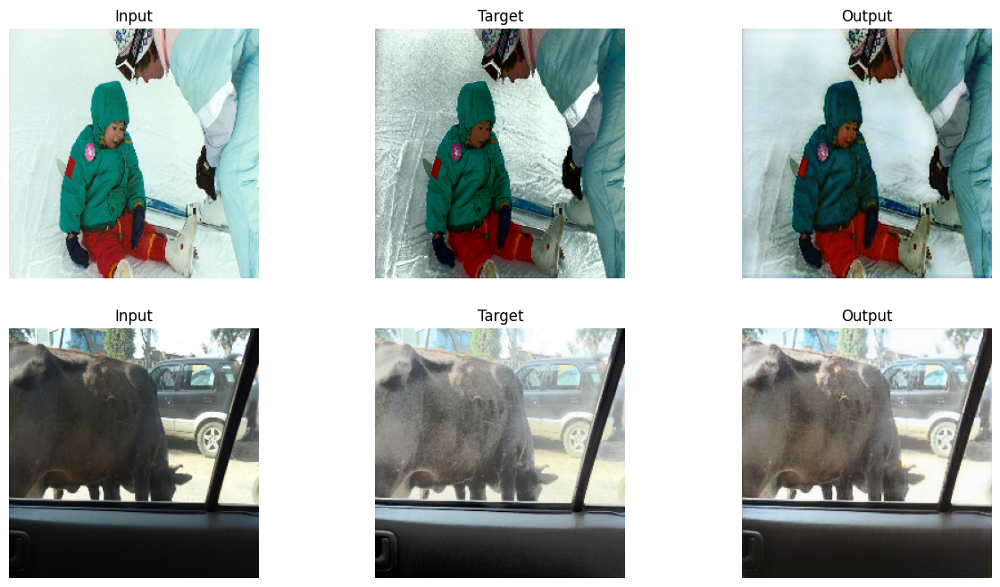

Val Epoch 50:  25%|██▌       | 1/4 [00:00<00:01,  1.54it/s, val_loss=0.00635]

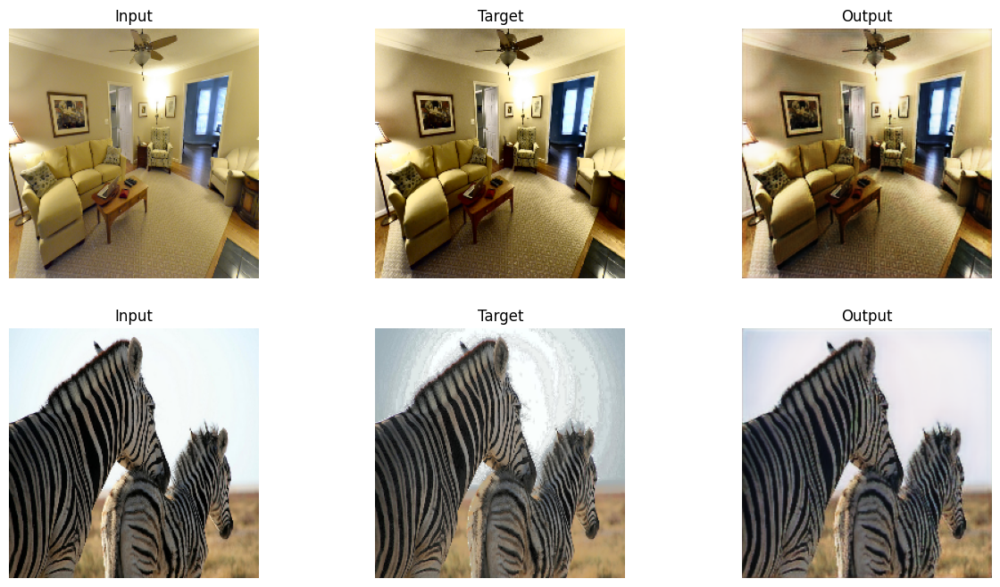

Val Epoch 60:  25%|██▌       | 1/4 [00:00<00:01,  1.77it/s, val_loss=0.00462]

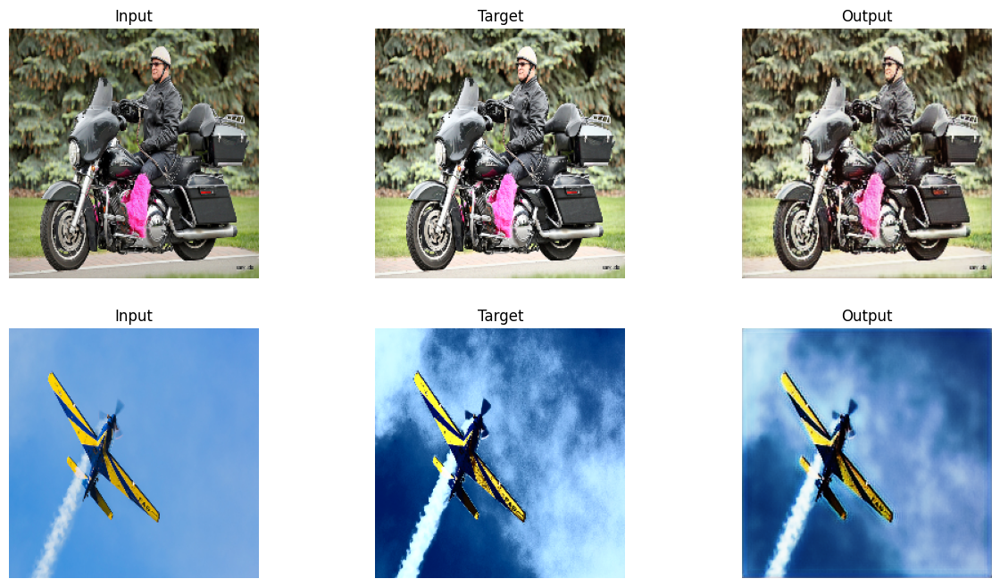

Val Epoch 70:  25%|██▌       | 1/4 [00:00<00:01,  1.59it/s, val_loss=0.00361]

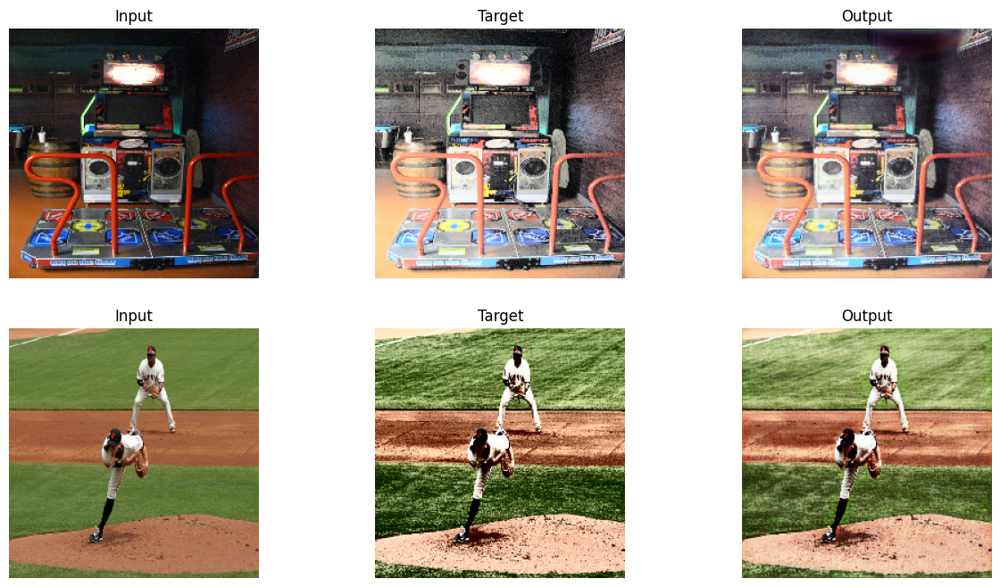

Val Epoch 80:  25%|██▌       | 1/4 [00:00<00:01,  1.62it/s, val_loss=0.00436]

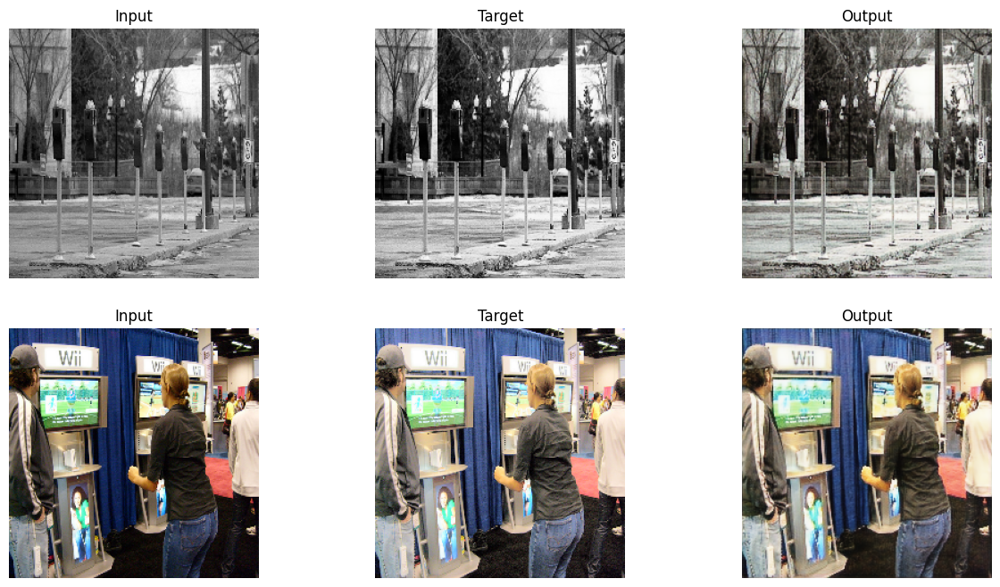

Val Epoch 90:  25%|██▌       | 1/4 [00:00<00:01,  1.53it/s, val_loss=0.0034]

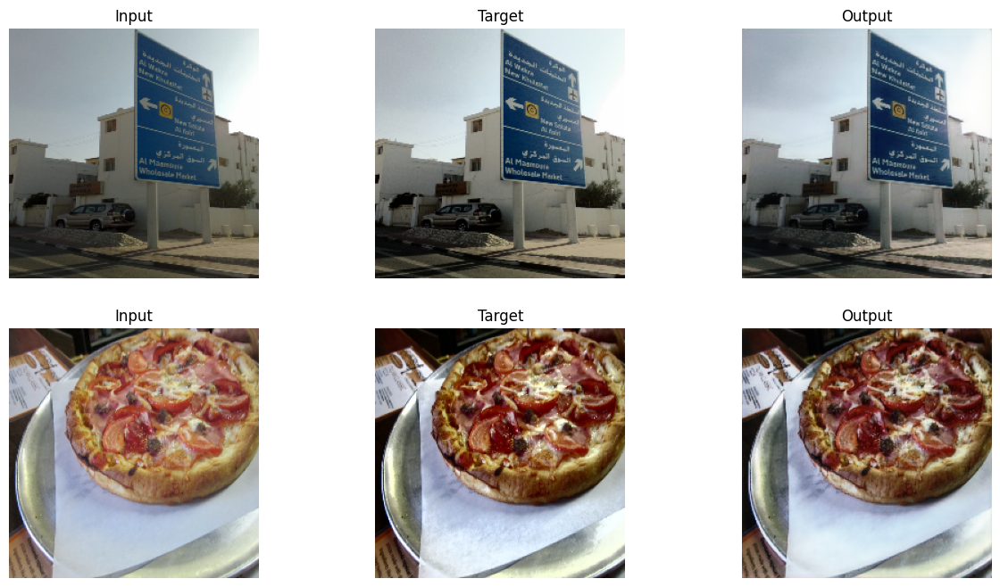

Val Epoch 99: 100%|██████████| 4/4 [00:01<00:00,  2.04it/s, val_loss=0.00482]


In [21]:

class CustomTrainer(Trainer):
    def visualize_output(self, sample, inputs, outputs, targets):
        images = []
        titles = []
                                    
        for _, (inp, output, target) in enumerate(
            zip(inputs, outputs, targets)
        ):
            if sample == self.config.display_samples_per_epoch:
                break

            inp = self.model.postprocess_output(inp).astype(np.uint8)
            output = self.model.postprocess_output(output).astype(np.uint8)
            target = self.model.postprocess_output(target).astype(np.uint8)
            images.extend(
                [
                    inp,
                    target,
                    output,
                ]
            )
            titles.extend(["Input", "Target", "Output"])
    
            sample += 1
        return images, titles, sample

config = TrainerConfig(
    result_dir=Path("../results"),
    expt_name="hist_eq",
    run_name=f"run_{datetime.datetime.now().date()}",
    epochs=100,
    show_images=True,
    batch_size=32,
    
)
model = smp.Unet("resnet18", classes=3, in_channels=3, activation="sigmoid")
model = ModelWrapper(
    model,
    postprocess=val_dataset.denormalization,
    preprocess=val_dataset.normalization,
)

optimizer = torch.optim.Adam(model.parameters())
criterion = nn.MSELoss()
trainer = CustomTrainer(
    model,
    config,
    optimizer,
    criterion,
    BaseLogger(BaseLoggerConfig(log_path=config.result_dir, name='hist_eq', log_in_console=False)),
    train_dataset,
    val_dataset,
)
trainer.train()

In [20]:
trainer.best_model_path

PosixPath('../results/hist_eq/run_2024-08-30/models/best_model.pth')

In [16]:
from cv_expt.utils.histogram import plot_hist
import matplotlib.pyplot as plt

loaded_model = torch.load(str(trainer.best_model_path))
test_root = Path("../data/test_images")
# test_root = Path("../data/coco2017/train2017")
images = []
titles=[]
max_data = 5
for i, test_img in enumerate(test_root.iterdir()):
    if i >= max_data:
        break
    rgb_img = cv2.imread(str(test_img))
    rgb_img = cv2.cvtColor(rgb_img, cv2.COLOR_BGR2RGB)
    
    rgb_img = cv2.resize(rgb_img, data_config.input_size[::-1])
    ycbr = cv2.cvtColor(rgb_img, cv2.COLOR_RGB2YCrCb)
    ycbr[:, :, 0] = hist_eq(ycbr[:, :, 0])
    heq_img = cv2.cvtColor(ycbr, cv2.COLOR_YCrCb2RGB)
    
    images.append(cv2.resize(rgb_img, data_config.input_size[::-1]))
    images.append(heq_img)
    img = rgb_img / 255.0
    img = torch.tensor(img, dtype=torch.float32).unsqueeze(0).unsqueeze(0)
    # print(img.shape)
    pred = loaded_model(img.cuda())
    # print(pred.shape)
    pred = pred.squeeze(0)#.squeeze(0)
    pred = pred.detach().cpu().permute(1, 2, 0).numpy()
    
    pred = (denormalization(pred)).astype(np.uint8)
    images.append(pred)
    print(pred.max(), pred.min())
    titles.extend(["Original", "Target", "Predicted RGB"])
    hist_orig = my_hist(images[0], 255)
    hist_pred = my_hist(pred, 255)
    # print(sum(hist_orig), sum(hist_pred))
    omax, omin = images[0].max(), images[0].min()
    pmax, pmin = pred.max(), pred.min()
    fig = plt.figure(figsize=(10, 5))
    plt.bar(np.arange(len(hist_orig)), hist_orig,  color='r', alpha=0.5, label=f'Original: [{omin}, {omax}]')
    plt.bar(np.arange(len(hist_pred)), hist_pred, color='b', alpha=0.5, label=f'Predicted: [{pmin}, {pmax}]')
    plt.legend()
    plt.title("Histogram")
    plt.show()
    break

from cv_expt.vis.visualization import subplot_images
subplot_images(images, order=(-1, 3), titles=titles, fig_size=(10, 20)).savefig(str(trainer.images_dir/"test_images.png"))

AttributeError: 'CustomTrainer' object has no attribute 'model_path'